# Exercise 2

## Using own function

Because the picture I use is 512x512, so I think I can use the funtion:   

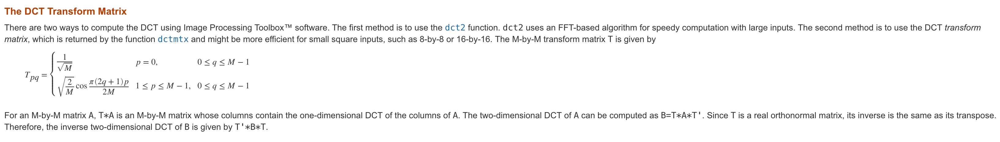

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("liftingbody.png",0)
img1 = img.astype('float') 

C_temp = np.zeros(img.shape)  
dct = np.zeros(img.shape)  
m,n = img.shape  
N = n  

C_temp[0, :] = 1 * np.sqrt(1/N)  
temp=[1]*6
temp1=[1]*6
for k in range (len(temp)):
    for i in range(1, m):  
         for j in range(n):  
            C_temp[i, j] = np.cos(np.pi * i * (2*j+1) / (2 * N )) * np.sqrt(2 / N )  
    dct = np.dot(C_temp , img1)  
    dct = np.dot(dct, np.transpose(C_temp))  
    temp[k] = dct
    temp1[k] = dct

dct1= np.log(abs(dct))
plt.imshow(dct1,'gray')

### Lowpass 

There is a fact:in the frequency domain, the human eye is insensitive to high frequency information.  
So DCT is making the information of picture concentrate on the top left, and we can give up some high-frequecny area.  
After DCT, the low-frequency area will be the top left and high-frequency area will be the bottom right.  
I select different ranges of bottom right area, and make the area into zero.  
The selected area is which I want to give up.  
Then I will use inverse DCT to recover the picture, and here are the results

In [2]:
low1 = temp[0]
low1[10:-1,10:-1] = 0 # the range of zero area 
idct1 = np.dot(np.transpose(C_temp) , low1)  
low11 = np.dot(idct1, C_temp) 
d1=abs(img-low11)

low2 = temp[1]
low2[20:-1,20:-1] = 0
idct2 = np.dot(np.transpose(C_temp) , low2)  
low22 = np.dot(idct2, C_temp) 
d2=abs(img-low22)

low3 = temp[2]
low3[50:-1,50:-1] = 0
idct3 = np.dot(np.transpose(C_temp) , low3)  
low33 = np.dot(idct3, C_temp) 
d3=abs(img-low33)

low4 = temp[3]
low4[100:-1,100:-1] = 0
idct4 = np.dot(np.transpose(C_temp) , low4)  
low44 = np.dot(idct4, C_temp) 
d4=abs(img-low44)

low5 = temp[4]
low5[200:-1,200:-1] = 0
idct5 = np.dot(np.transpose(C_temp) , low5)  
low55 = np.dot(idct5, C_temp) 
d5=abs(img-low55)

low6 = temp[5]
low6[300:-1,300:-1] = 0
idct6 = np.dot(np.transpose(C_temp) , low6)  
low66 = np.dot(idct6, C_temp) 
d6=abs(img-low66)


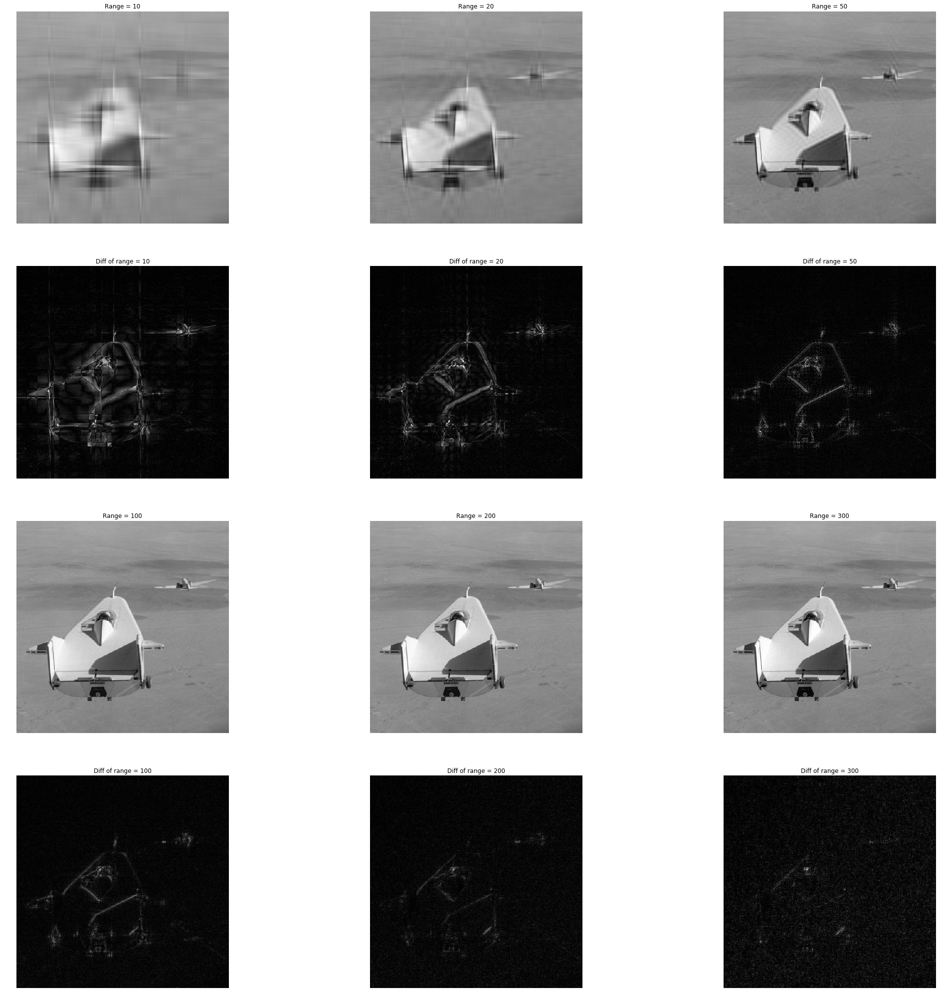

In [3]:
plt.figure(figsize=(36, 36))
plt.subplot(4,3,1)
plt.title('Range = 10')
plt.imshow(low11,'gray')
plt.axis('off')
plt.subplot(4,3,2)
plt.title('Range = 20')
plt.imshow(low22,'gray')
plt.axis('off')
plt.subplot(4,3,3)
plt.title('Range = 50')
plt.imshow(low33,'gray')
plt.axis('off')
plt.subplot(4,3,4)
plt.title('Diff of range = 10')
plt.imshow(d1,'gray')
plt.axis('off')
plt.subplot(4,3,5)
plt.title('Diff of range = 20')
plt.imshow(d2,'gray')
plt.axis('off')
plt.subplot(4,3,6)
plt.title('Diff of range = 50')
plt.imshow(d3,'gray')
plt.axis('off')
plt.subplot(4,3,7)
plt.title('Range = 100')
plt.imshow(low44,'gray')
plt.axis('off')
plt.subplot(4,3,8)
plt.title('Range = 200')
plt.imshow(low55,'gray')
plt.axis('off')
plt.subplot(4,3,9)
plt.title('Range = 300')
plt.imshow(low66,'gray')
plt.axis('off')
plt.subplot(4,3,10)
plt.title('Diff of range = 100')
plt.imshow(d4,'gray')
plt.axis('off')
plt.subplot(4,3,11)
plt.title('Diff of range = 200')
plt.imshow(d5,'gray')
plt.axis('off')
plt.subplot(4,3,12)
plt.title('Diff of range = 300')
plt.imshow(d6,'gray')
plt.axis('off')
plt.show()

Firstly, I chose a big area(range of the area is $((512-10=502)$ $502 * 502$).  
We can see that the recovered picture is very blurry, that means some information of the original picture has lost.  
Then I decrease the range of area. And the recovered picture becomes more clear. Because bigger low-frequency area will include much more information, and picture will be recovered better.  
When I decrease the selected area into $((512-200=312)$ $312*312)$ and $((512-300=212)$ $212*212)$, the two recovered picture looks closed. I think the reason is the high-frequency area I selected to give up has little information, so continue to decreae the range of area is not useful.  
In conclusion, the biggest high-frequency area we can give up is $312*312$.

### Highpass

High-pass means making low-frequency area into zero.  
In DCT, low-frequency area is in the top left, so I select different ranges of the top left area and make the area into zero.  
Then recover the picture using inversing DCT.  
Here are the results:

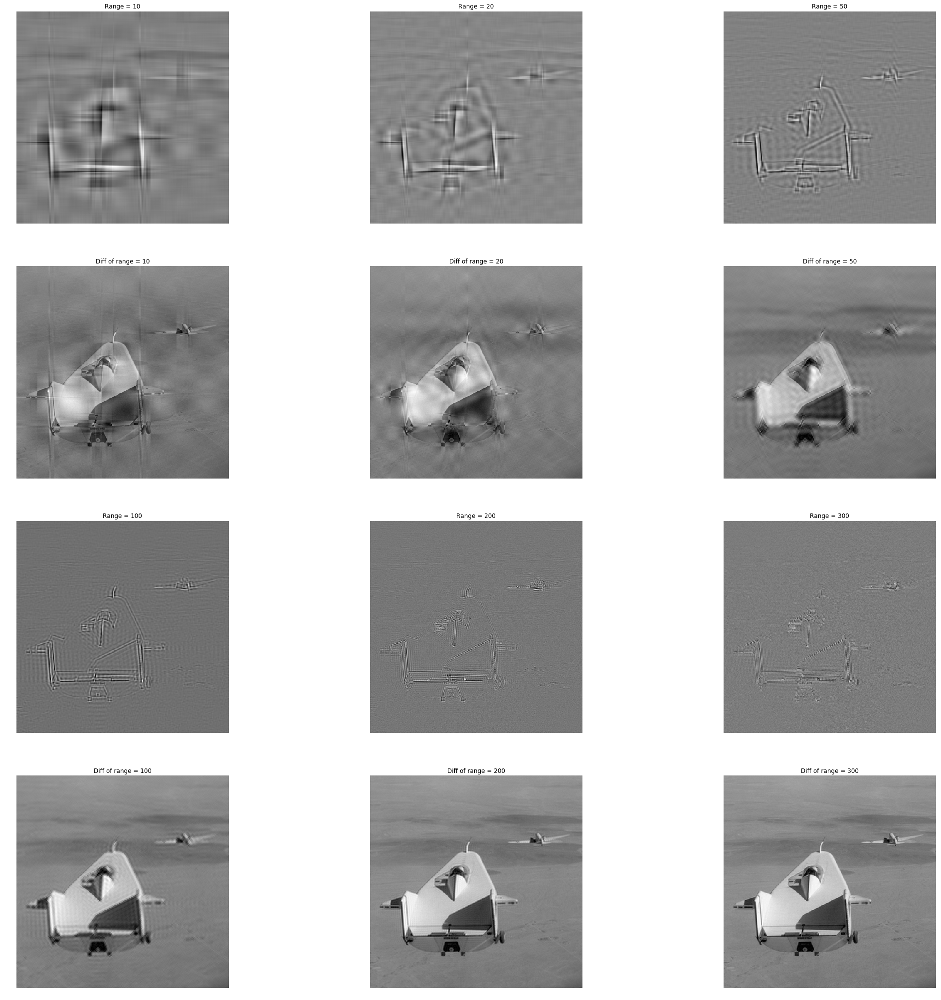

In [4]:
high1 = temp1[0]
high1[0:10,0:10] = 0
idct11 = np.dot(np.transpose(C_temp) , high1)  
high11 = np.dot(idct11, C_temp) 
d11=abs(img-high11)

high2 = temp1[1]
high2[0:20,0:20] = 0
idct22 = np.dot(np.transpose(C_temp) , high2)  
high22 = np.dot(idct22, C_temp) 
d22=abs(img-high22)

high3 = temp1[2]
high3[0:50,0:50] = 0
idct33 = np.dot(np.transpose(C_temp) , high3)  
high33 = np.dot(idct33, C_temp) 
d33=abs(img-high33)

high4 = temp1[3]
high4[0:100,0:100] = 0
idct44 = np.dot(np.transpose(C_temp) , high4)  
high44 = np.dot(idct44, C_temp) 
d44=abs(img-high44)

high5 = temp1[4]
high5[0:200,0:200] = 0
idct55 = np.dot(np.transpose(C_temp) , high5)  
high55 = np.dot(idct55, C_temp) 
d55=abs(img-high55)

high6 = temp1[5]
high6[0:300,0:300] = 0
idct66 = np.dot(np.transpose(C_temp) , high6)  
high66 = np.dot(idct66, C_temp) 
d66=abs(img-high66)


plt.figure(figsize=(36, 36))
plt.subplot(4,3,1)
plt.title('Range = 10')
plt.imshow(high11,'gray')
plt.axis('off')
plt.subplot(4,3,2)
plt.title('Range = 20')
plt.imshow(high22,'gray')
plt.axis('off')
plt.subplot(4,3,3)
plt.title('Range = 50')
plt.imshow(high33,'gray')
plt.axis('off')
plt.subplot(4,3,4)
plt.title('Diff of range = 10')
plt.imshow(d11,'gray')
plt.axis('off')
plt.subplot(4,3,5)
plt.title('Diff of range = 20')
plt.imshow(d22,'gray')
plt.axis('off')
plt.subplot(4,3,6)
plt.title('Diff of range = 50')
plt.imshow(d33,'gray')
plt.axis('off')
plt.subplot(4,3,7)
plt.title('Range = 100')
plt.imshow(high44,'gray')
plt.axis('off')
plt.subplot(4,3,8)
plt.title('Range = 200')
plt.imshow(high55,'gray')
plt.axis('off')
plt.subplot(4,3,9)
plt.title('Range = 300')
plt.imshow(high66,'gray')
plt.axis('off')
plt.subplot(4,3,10)
plt.title('Diff of range = 100')
plt.imshow(d44,'gray')
plt.axis('off')
plt.subplot(4,3,11)
plt.title('Diff of range = 200')
plt.imshow(d55,'gray')
plt.axis('off')
plt.subplot(4,3,12)
plt.title('Diff of range = 300')
plt.imshow(d66,'gray')
plt.axis('off')
plt.show()

In DCT, the left top of picture has the most information.  
With the increasing the area, the worse recovered picture.  
Because the bigger area of top left becomes zero, the more information will lose.  
Similarly, when the range of the area I selected is 200 and 300, there is little difference between two recovered picture.  
Because $(0-200,0-200)$ area has the most important imformation of original picture. So continue to increase the area, there is no much information lose.  

## Using the DCT function in open cv

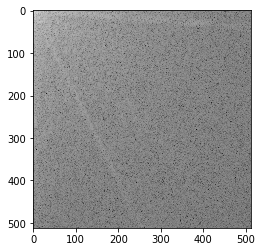

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("liftingbody.png",0)
img1 = img.astype('float') 
img_dct = cv2.dct(img1)
img_dct_log = np.log(abs(img_dct)) 
plt.imshow(img_dct_log,'gray')

### Lowpass in opencv

In [6]:
lowpass1 = img_dct
lowpass1[10:-1,10:-1] = 0
lowpass11= cv2.idct(lowpass1)
diff1=abs(img-lowpass11)

img_dct = cv2.dct(img1)
lowpass2 = img_dct
lowpass2[20:-1,20:-1] = 0
lowpass22= cv2.idct(lowpass2)
diff2=abs(img-lowpass22)

img_dct = cv2.dct(img1)
lowpass3 = img_dct
lowpass3[50:-1,50:-1] = 0
lowpass33= cv2.idct(lowpass3)
diff3=abs(img-lowpass33)

img_dct = cv2.dct(img1)
lowpass4 = img_dct
lowpass4[100:-1,100:-1] = 0
lowpass44= cv2.idct(lowpass4)
diff4=abs(img-lowpass44)

img_dct = cv2.dct(img1)
lowpass5 = img_dct
lowpass5[200:-1,200:-1] = 0
lowpass55= cv2.idct(lowpass5)
diff5=abs(img-lowpass55)

img_dct = cv2.dct(img1)
lowpass6 = img_dct
lowpass6[300:-1,300:-1] = 0
lowpass66= cv2.idct(lowpass6)
diff6=abs(img-lowpass66)


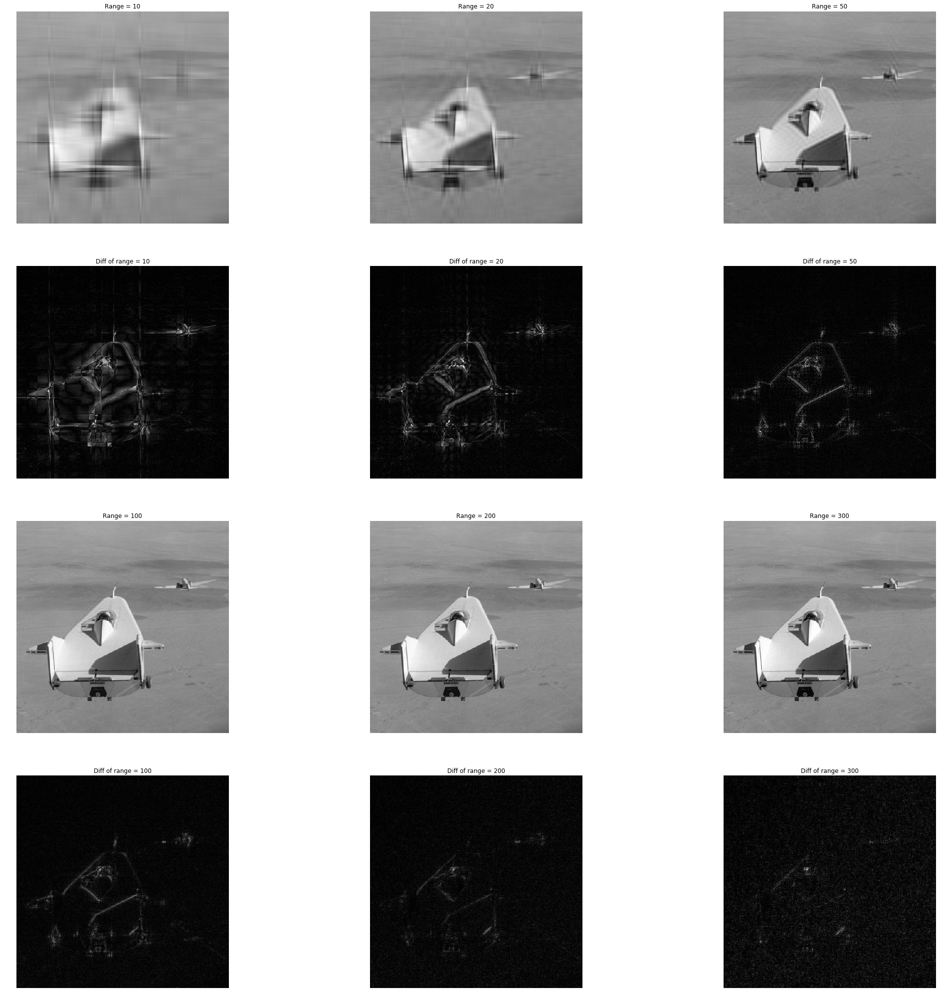

In [7]:
plt.figure(figsize=(36, 36))
plt.subplot(4,3,1)
plt.title('Range = 10')
plt.imshow(lowpass11,'gray')
plt.axis('off')
plt.subplot(4,3,2)
plt.title('Range = 20')
plt.imshow(lowpass22,'gray')
plt.axis('off')
plt.subplot(4,3,3)
plt.title('Range = 50')
plt.imshow(lowpass33,'gray')
plt.axis('off')
plt.subplot(4,3,4)
plt.title('Diff of range = 10')
plt.imshow(diff1,'gray')
plt.axis('off')
plt.subplot(4,3,5)
plt.title('Diff of range = 20')
plt.imshow(diff2,'gray')
plt.axis('off')
plt.subplot(4,3,6)
plt.title('Diff of range = 50')
plt.imshow(diff3,'gray')
plt.axis('off')
plt.subplot(4,3,7)
plt.title('Range = 100')
plt.imshow(lowpass44,'gray')
plt.axis('off')
plt.subplot(4,3,8)
plt.title('Range = 200')
plt.imshow(lowpass55,'gray')
plt.axis('off')
plt.subplot(4,3,9)
plt.title('Range = 300')
plt.imshow(lowpass66,'gray')
plt.axis('off')
plt.subplot(4,3,10)
plt.title('Diff of range = 100')
plt.imshow(diff4,'gray')
plt.axis('off')
plt.subplot(4,3,11)
plt.title('Diff of range = 200')
plt.imshow(diff5,'gray')
plt.axis('off')
plt.subplot(4,3,12)
plt.title('Diff of range = 300')
plt.imshow(diff6,'gray')
plt.axis('off')
plt.show()

### High pass in opencv

In [8]:
img_dct = cv2.dct(img1)
highpass1 = img_dct
highpass1[0:10,0:10] = 0
highpass11= cv2.idct(highpass1)
diff11=abs(img-highpass11)

img_dct = cv2.dct(img1)
highpass2 = img_dct
highpass2[0:20,0:20] = 0
highpass22= cv2.idct(highpass2)
diff22=abs(img-highpass22)

img_dct = cv2.dct(img1)
highpass3 = img_dct
highpass3[0:50,0:50] = 0
highpass33= cv2.idct(highpass3)
diff33=abs(img-highpass33)

img_dct = cv2.dct(img1)
highpass4 = img_dct
highpass4[0:100,0:100] = 0
highpass44= cv2.idct(highpass4)
diff44=abs(img-highpass44)

img_dct = cv2.dct(img1)
highpass5 = img_dct
highpass5[0:200,0:200] = 0
highpass55= cv2.idct(highpass5)
diff55=abs(img-highpass55)

img_dct = cv2.dct(img1)
highpass6 = img_dct
highpass6[0:300,0:300] = 0
highpass66= cv2.idct(highpass6)
diff66=abs(img-highpass66)

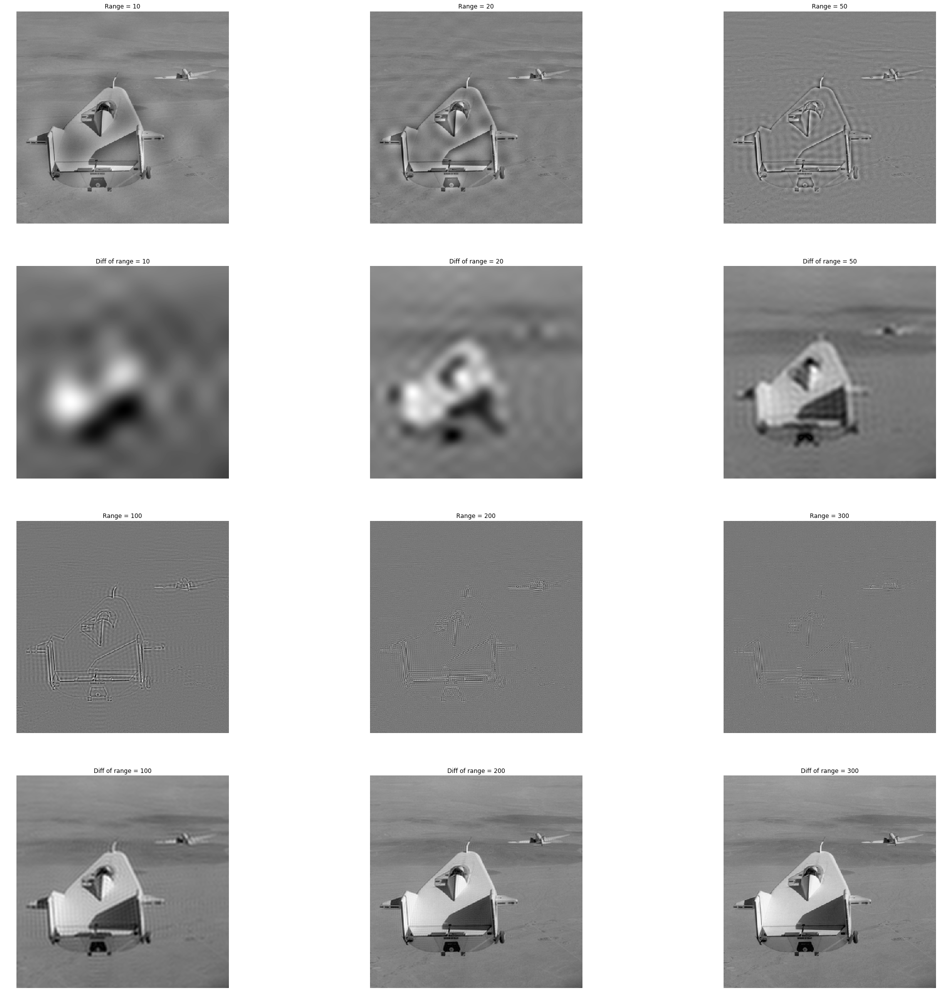

In [9]:
plt.figure(figsize=(36,36))
plt.subplot(4,3,1)
plt.title('Range = 10')
plt.imshow(highpass11,'gray')
plt.axis('off')
plt.subplot(4,3,2)
plt.title('Range = 20')
plt.imshow(highpass22,'gray')
plt.axis('off')
plt.subplot(4,3,3)
plt.title('Range = 50')
plt.imshow(highpass33,'gray')
plt.axis('off')
plt.subplot(4,3,4)
plt.title('Diff of range = 10')
plt.imshow(diff11,'gray')
plt.axis('off')
plt.subplot(4,3,5)
plt.title('Diff of range = 20')
plt.imshow(diff22,'gray')
plt.axis('off')
plt.subplot(4,3,6)
plt.title('Diff of range = 50')
plt.imshow(diff33,'gray')
plt.axis('off')
plt.subplot(4,3,7)
plt.title('Range = 100')
plt.imshow(highpass44,'gray')
plt.axis('off')
plt.subplot(4,3,8)
plt.title('Range = 200')
plt.imshow(highpass55,'gray')
plt.axis('off')
plt.subplot(4,3,9)
plt.title('Range = 300')
plt.imshow(highpass66,'gray')
plt.axis('off')
plt.subplot(4,3,10)
plt.title('Diff of range = 100')
plt.imshow(diff44,'gray')
plt.axis('off')
plt.subplot(4,3,11)
plt.title('Diff of range = 200')
plt.imshow(diff55,'gray')
plt.axis('off')
plt.subplot(4,3,12)
plt.title('Diff of range = 300')
plt.imshow(diff66,'gray')
plt.axis('off')
plt.show()

Same conclusion. 

 ## Use a people picture

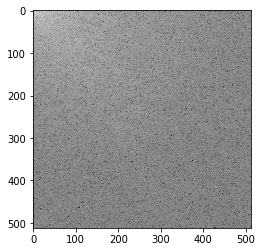

In [10]:
img = cv2.imread("lena.png",0)
img1 = img.astype('float') 
img_dct = cv2.dct(img1)
img_dct_log = np.log(abs(img_dct)) 
plt.imshow(img_dct_log,'gray')

### Low pass

In [11]:
lowpass1 = img_dct
lowpass1[10:-1,10:-1] = 0
lowpass11= cv2.idct(lowpass1)
diff1=abs(img-lowpass11)

img_dct = cv2.dct(img1)
lowpass2 = img_dct
lowpass2[20:-1,20:-1] = 0
lowpass22= cv2.idct(lowpass2)
diff2=abs(img-lowpass22)

img_dct = cv2.dct(img1)
lowpass3 = img_dct
lowpass3[50:-1,50:-1] = 0
lowpass33= cv2.idct(lowpass3)
diff3=abs(img-lowpass33)

img_dct = cv2.dct(img1)
lowpass4 = img_dct
lowpass4[100:-1,100:-1] = 0
lowpass44= cv2.idct(lowpass4)
diff4=abs(img-lowpass44)

img_dct = cv2.dct(img1)
lowpass5 = img_dct
lowpass5[200:-1,200:-1] = 0
lowpass55= cv2.idct(lowpass5)
diff5=abs(img-lowpass55)

img_dct = cv2.dct(img1)
lowpass6 = img_dct
lowpass6[300:-1,300:-1] = 0
lowpass66= cv2.idct(lowpass6)
diff6=abs(img-lowpass66)


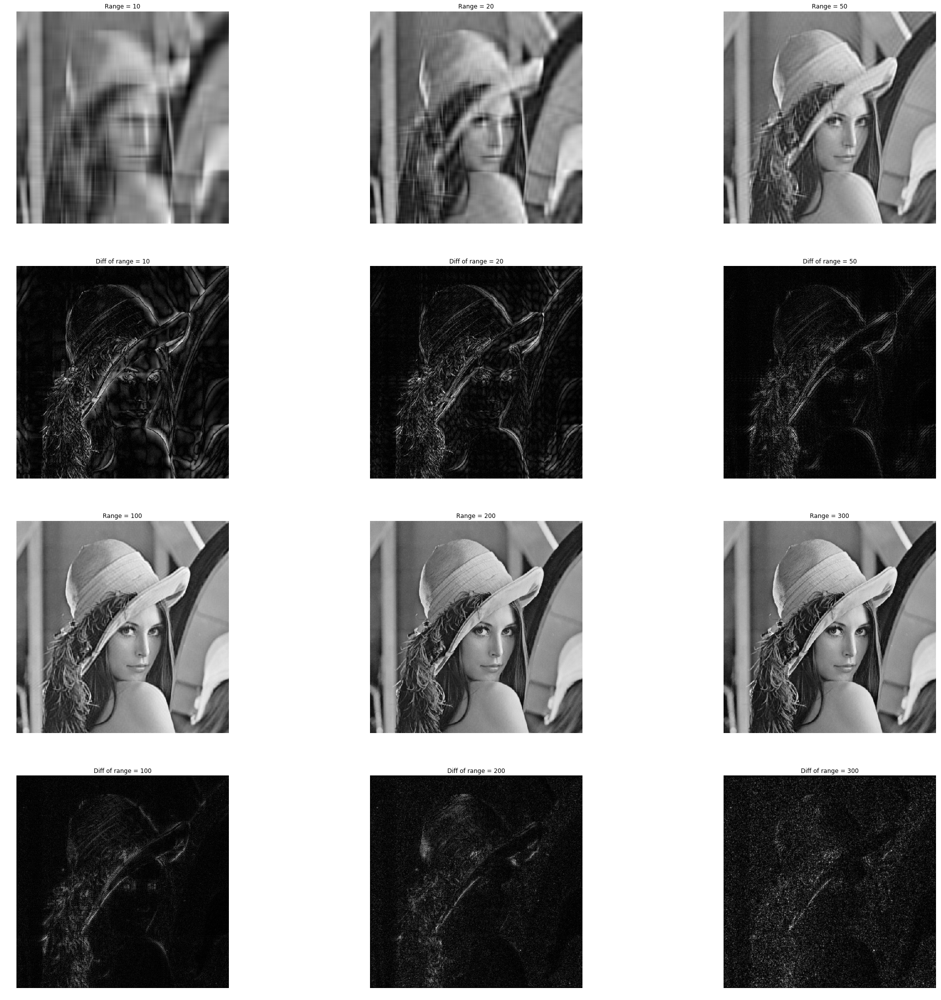

In [12]:
plt.figure(figsize=(36, 36))
plt.subplot(4,3,1)
plt.title('Range = 10')
plt.imshow(lowpass11,'gray')
plt.axis('off')
plt.subplot(4,3,2)
plt.title('Range = 20')
plt.imshow(lowpass22,'gray')
plt.axis('off')
plt.subplot(4,3,3)
plt.title('Range = 50')
plt.imshow(lowpass33,'gray')
plt.axis('off')
plt.subplot(4,3,4)
plt.title('Diff of range = 10')
plt.imshow(diff1,'gray')
plt.axis('off')
plt.subplot(4,3,5)
plt.title('Diff of range = 20')
plt.imshow(diff2,'gray')
plt.axis('off')
plt.subplot(4,3,6)
plt.title('Diff of range = 50')
plt.imshow(diff3,'gray')
plt.axis('off')
plt.subplot(4,3,7)
plt.title('Range = 100')
plt.imshow(lowpass44,'gray')
plt.axis('off')
plt.subplot(4,3,8)
plt.title('Range = 200')
plt.imshow(lowpass55,'gray')
plt.axis('off')
plt.subplot(4,3,9)
plt.title('Range = 300')
plt.imshow(lowpass66,'gray')
plt.axis('off')
plt.subplot(4,3,10)
plt.title('Diff of range = 100')
plt.imshow(diff4,'gray')
plt.axis('off')
plt.subplot(4,3,11)
plt.title('Diff of range = 200')
plt.imshow(diff5,'gray')
plt.axis('off')
plt.subplot(4,3,12)
plt.title('Diff of range = 300')
plt.imshow(diff6,'gray')
plt.axis('off')
plt.show()

### High pass

In [13]:
img_dct = cv2.dct(img1)
highpass1 = img_dct
highpass1[0:10,0:10] = 0
highpass11= cv2.idct(highpass1)
diff11=abs(img-highpass11)

img_dct = cv2.dct(img1)
highpass2 = img_dct
highpass2[0:20,0:20] = 0
highpass22= cv2.idct(highpass2)
diff22=abs(img-highpass22)

img_dct = cv2.dct(img1)
highpass3 = img_dct
highpass3[0:50,0:50] = 0
highpass33= cv2.idct(highpass3)
diff33=abs(img-highpass33)

img_dct = cv2.dct(img1)
highpass4 = img_dct
highpass4[0:100,0:100] = 0
highpass44= cv2.idct(highpass4)
diff44=abs(img-highpass44)

img_dct = cv2.dct(img1)
highpass5 = img_dct
highpass5[0:200,0:200] = 0
highpass55= cv2.idct(highpass5)
diff55=abs(img-highpass55)

img_dct = cv2.dct(img1)
highpass6 = img_dct
highpass6[0:300,0:300] = 0
highpass66= cv2.idct(highpass6)
diff66=abs(img-highpass66)

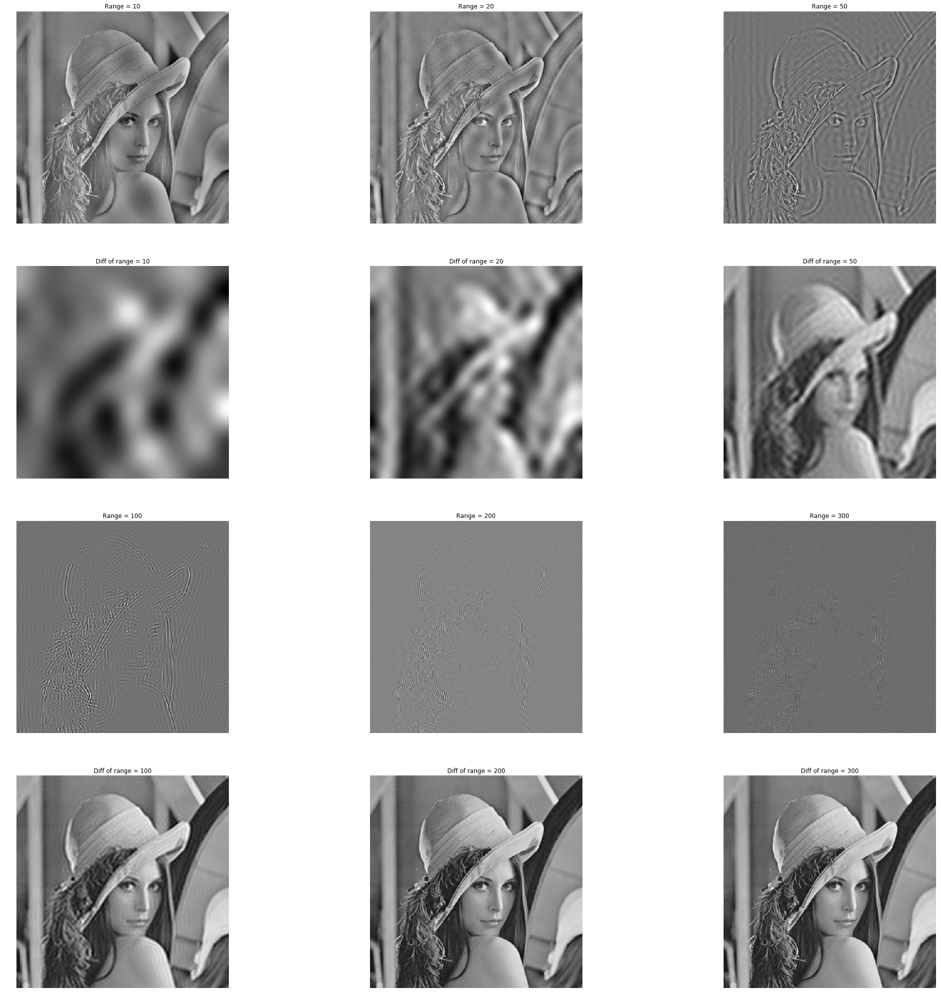

In [14]:
plt.figure(figsize=(36,36))
plt.subplot(4,3,1)
plt.title('Range = 10')
plt.imshow(highpass11,'gray')
plt.axis('off')
plt.subplot(4,3,2)
plt.title('Range = 20')
plt.imshow(highpass22,'gray')
plt.axis('off')
plt.subplot(4,3,3)
plt.title('Range = 50')
plt.imshow(highpass33,'gray')
plt.axis('off')
plt.subplot(4,3,4)
plt.title('Diff of range = 10')
plt.imshow(diff11,'gray')
plt.axis('off')
plt.subplot(4,3,5)
plt.title('Diff of range = 20')
plt.imshow(diff22,'gray')
plt.axis('off')
plt.subplot(4,3,6)
plt.title('Diff of range = 50')
plt.imshow(diff33,'gray')
plt.axis('off')
plt.subplot(4,3,7)
plt.title('Range = 100')
plt.imshow(highpass44,'gray')
plt.axis('off')
plt.subplot(4,3,8)
plt.title('Range = 200')
plt.imshow(highpass55,'gray')
plt.axis('off')
plt.subplot(4,3,9)
plt.title('Range = 300')
plt.imshow(highpass66,'gray')
plt.axis('off')
plt.subplot(4,3,10)
plt.title('Diff of range = 100')
plt.imshow(diff44,'gray')
plt.axis('off')
plt.subplot(4,3,11)
plt.title('Diff of range = 200')
plt.imshow(diff55,'gray')
plt.axis('off')
plt.subplot(4,3,12)
plt.title('Diff of range = 300')
plt.imshow(diff66,'gray')
plt.axis('off')
plt.show()

Same conclusion with former picture, but there is a little difference.  
Because the information of different picture concentrate in different sizes area of top left.